In [21]:
## Load packages
library(stringr)
library(readxl)
library(rentrez)
library(Biostrings)
library(dplyr)
library(tidyr)
library(jsonlite)
library(ggplot2)
library(viridis)
library(gggenes)
library(sf)
library(spData)
library(maps)
library(mapproj)

In [22]:
## Adjust PATH
wd <- getwd()
subdir <- "/bin" # should be 'scripts' if location is ./scripts/thisfile
if (endsWith(wd, subdir)) {
    wd <- str_remove(wd, subdir)
    setwd(wd)
}
getwd()

[1] "/home/dieol22p/arabinosylation-anti-CRISPR"

In [23]:
## Define variables
path <- "data/phages/"

genomes <- list(
    overview = "overview.csv",
    annotation = "annotation.gtf",
    archive = "genomes/ncbi_dataset/data/"
)
for (i in names(genomes)) {genomes[[i]] <- paste0(path, genomes[[i]])}

ncbi <- list()
for (i in list.files(genomes$archive)) {
    j <- str_split(i, "\\.")[[1]][1]
    ncbi[[j]] <- paste0(genomes$archive, i)
}
ncbi

$annotation_report
[1] "data/phages/genomes/ncbi_dataset/data/annotation_report.jsonl"

$biosample_report
[1] "data/phages/genomes/ncbi_dataset/data/biosample_report.jsonl"

$cds
[1] "data/phages/genomes/ncbi_dataset/data/cds.fna"

$data_report
[1] "data/phages/genomes/ncbi_dataset/data/data_report.jsonl"

$dataset_catalog
[1] "data/phages/genomes/ncbi_dataset/data/dataset_catalog.json"

$genomic
[1] "data/phages/genomes/ncbi_dataset/data/genomic.fna"

$protein
[1] "data/phages/genomes/ncbi_dataset/data/protein.faa"

$virus_dataset
[1] "data/phages/genomes/ncbi_dataset/data/virus_dataset.md"

In [24]:
# Colors
cols <- list(
    annotation = c(
        "Structural"="indianred",
        "Lysin"="darkorange",
        "Tape measure"="seagreen3",
        "Enzyme"="cyan4",
        "Immune system"="deeppink",
        'Regulatory'='cadetblue1',
        "Hypothetical"="grey30",
        "Unknown"="white"
  ),
    old_annotation = c(
        "Tail"="indianred",
        "TAC"="hotpink",
        "Lysin"="darkorange",
        "Capsid"="cyan3",
        "Tape measure"="seagreen3",
        "Collar"="deeppink",
        "Enzyme"="wheat",
        "Immune System"="navy",
        "Replication machinery"="white",
        'Transcription factor'='black',
        "Hypothetical"="grey30",
        "Other"="grey"
  ),
    rbp_type = c(
        "RBP"="indianred",
        "Adhesin"="darkorange",
        "Dit"="navy",
        "Putative RBP"="purple",
        "None"="grey"
    )
)

In [92]:
## Read data
report <- read.csv(genomes$overview)
gtf <- read.delim(genomes$annotation, sep = "\t", header = TRUE, stringsAsFactors = FALSE)
ann <- read_excel("docs/supplementary-tables.xlsx", "proteins")

In [102]:
# Modify report ---------------------------------------------------

## Genus
report$Genus <- as.character(report$virusGenus)
df <- as.data.frame(table(report$Genus))
report$Genus[is.na(report$Genus)] <- "Other"
index <- report$Genus %in% as.character(df[[1]][df[[2]] <=3])
report$Genus[index] <- "Other"

### Genus size
report$N <- 1
report <- report %>% group_by(Genus) %>% mutate(Count = sum(N))
report$Genus <- reorder(report$Genus, report$Count, decreasing=TRUE)
index <- which(levels(report$Genus)=="Other")
report$Genus <- factor(report$Genus, c(levels(report$Genus)[-index], "Other"))

# Modify GTF --------------------------------------------------

## Annotation
index <- match(gtf$Gene.CDS.Protein.FASTA.Accession, ann$`protein-accession`)
gtf$annotation <- ann$name[index]

## Start - stop
gtf <- mutate(gtf, gene_start=Gene.CDS.Nucleotide.FASTA.Range.Start, gene_stop = Gene.CDS.Nucleotide.FASTA.Range.Stop)

## Subset
gtf <- subset(gtf, Accession %in% report$accession)
gtf <- subset(gtf, !is.na(gene_start))

## Create combined data.frame  --------------------------------------------------
data <- merge(gtf, report, by.x = 'Accession', by.y = 'accession')
data$phage_id <- paste0(data$virusName,'_', data$Accession)

In [103]:
table(ann$`protein-accession` %in% gtf$Gene.CDS.Protein.FASTA.Accession)
dim(ann)
dim(gtf)


FALSE  TRUE 
  185    38 

[1] 223   5

[1] 8694   12

In [104]:
# Check which organisms are not in the selection
x <- unique(ann$organism) %in% report$virusName
unique(ann$organism)[!x]

[1] "Achromobacter phage 83-24"             
 [2] "Achromobacter phage JWX"               
 [3] "Aeromonas phage 25"                    
 [4] "Aeromonas phage 44RR2.8t"              
 [5] "Alphaproteobacteria phage PhiJL001"    
 [6] "Bacillus phage CP-51"                  
 [7] "Bacillus phage G"                      
 [8] "Bacillus phage SP-10"                  
 [9] "Bacillus phage SPO1"                   
[10] "Citrobacter phage Merlin"              
[11] "Delftia phage PhiW-14"                 
[12] "Dickeya phage vB-DsoM-LIMEstone1"      
[13] "E. coli ThyA"                          
[14] "Enterobacter phage CC31"               
[15] "Escherichia phage Bas46"               
[16] "Escherichia phage Bas47"               
[17] "Escherichia phage T5"                  
[18] "Escherichia phage wV7"                 
[19] "Pectobacterium bacteriophage PM2"      
[20] "Pseudomonas phage M6"                  
[21] "Pseudomonas phage MP1412"              
[22] "Ralstonia phage phiRSL1"               
[23] "Rhodoferax phage P26218"               
[24] "Roseobacter phage RDJL Phi 1"          
[25] "Salmonella phage vB_SenM-S16"          
[26] "Serratia phage PS2"                    
[27] "Shigella phage pSs-1"                  
[28] "Sphingomonas phage PAU"                
[29] "Stenotrophomonas phage IME13"          
[30] "Xanthomonas phage Xp15"                
[31] "Yersinia phage PST"                    
[32] "Acinetobacter phage AB-Navy1"          
[33] "Acinetobacter phage AB-Navy71"         
[34] "Acinetobacter phage AB-Navy97"         
[35] "Acinetobacter phage AbTZA1"            
[36] "Acinetobacter phage AC4"               
[37] "Acinetobacter phage Acj9"              
[38] "Acinetobacter phage KARL-1"            
[39] "Acinetobacter phage MD-2021a"          
[40] "Acinetobacter phage Meroveus"          
[41] "Acinetobacter phage PhaR5"             
[42] "Acinetobacter phage vB_AbaM_AB-Navy-v2"
[43] "Acinetobacter phage vB_AbaM_Apostate"  
[44] "Acinetobacter phage vB_AbaM_Berthold"  
[45] "Acinetobacter phage vB_AbaM_DLP1"      
[46] "Acinetobacter phage vB_AbaM_DLP2"      
[47] "Acinetobacter phage vB_AbaM_DP45"      
[48] "Acinetobacter phage vB_AbaM_Kimel"     
[49] "Acinetobacter phage vB_AbaM_Konradin"  
[50] "Acinetobacter phage vB_AbaM_Lazarus"   
[51] "Acinetobacter phage vB_AbaM_PhT2"      
[52] "Acinetobacter phage vB_AbaM_Porter"    
[53] "Acinetobacter phage vB_ApiM_fHyAci03"  
[54] "Enterobacteria phage ATK47"            
[55] "Escherichia phage a20"                 
[56] "Escherichia phage AV109"               
[57] "Escherichia phage AV110"               
[58] "Escherichia phage AV111"               
[59] "Escherichia phage AV117"               
[60] "Escherichia phage AV118"               
[61] "Escherichia phage ECCR664"             
[62] "Escherichia phage F2"                  
[63] "Escherichia phage FL18"                
[64] "Escherichia phage JM17"                
[65] "Escherichia phage JN02"                
[66] "Escherichia phage LH01"                
[67] "Escherichia phage moskry"              
[68] "Escherichia phage OLB35"               
[69] "Escherichia phage p000y"               
[70] "Escherichia phage PHB12"               
[71] "Escherichia phage phiE142"             
[72] "Escherichia phage PNJ-6"               
[73] "Escherichia phage PTK"                 
[74] "Escherichia phage ST0"                 
[75] "Escherichia phage vB_Eco_F27"          
[76] "Escherichia phage vB_Eco_F31"          
[77] "Escherichia phage vB_Eco_NicPhage"     
[78] "Escherichia phage vB_EcoM_EP32a"       
[79] "Escherichia phage vB_EcoM_ESCO47"      
[80] "Escherichia phage vB_EcoM_G2285"       
[81] "Escherichia phage vB_EcoM_G2469"       
[82] "Escherichia phage vB_EcoM_G53"         
[83] "Escherichia phage vB_EcoM_JS09"        
[84] "Escherichia phage vB_EcoM_KAW3E185"    
[85] "Escherichia phage vB_EcoM_MM02"        
[86] "Escherichia phage vB_EcoM_NBG1"        
[87] "Escherichia phage vB_EcoM_PhAPEC2"     

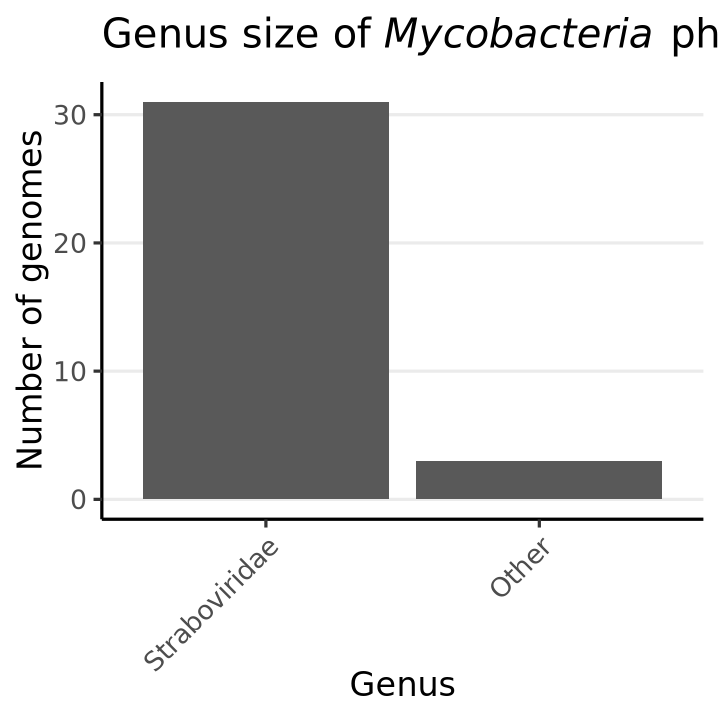

In [105]:
## Compare virus genera
options(repr.plot.width=6, repr.plot.height=6)

df <- report %>% group_by(Genus) %>% summarize(Count = sum(N))

# Plot
ggplot(df, aes(Genus, Count)) +
    geom_col() +
    theme_classic(20) +
    theme(
        axis.text.x = element_text(angle=45, hjust=1, vjust=1),
        panel.grid.major.y = element_line()
    ) +
    labs(title=substitute(paste('Genus size of ',italic('Mycobacteria'),' phages')),
        x='Genus', y='Number of genomes')

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_point()`).”


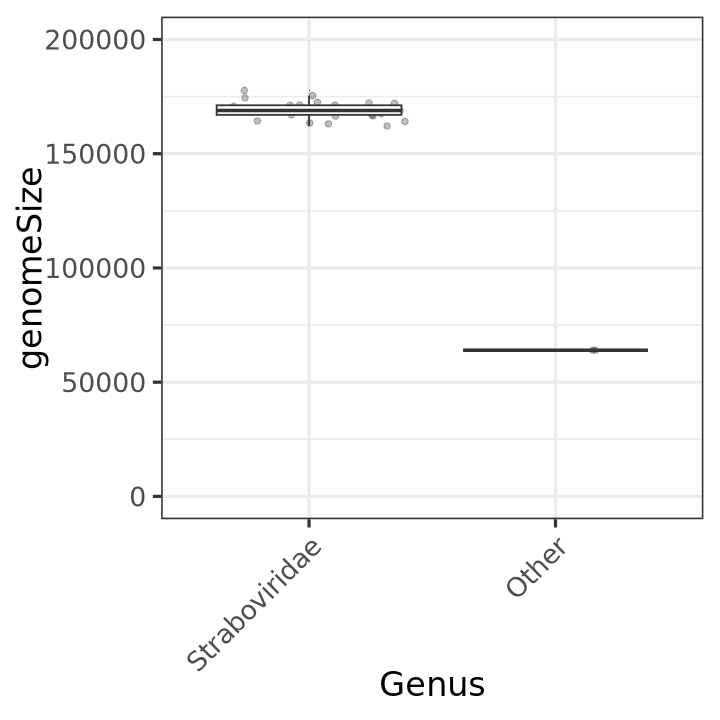

In [106]:
## Compare virus genus
options(repr.plot.width=6, repr.plot.height=6)

# Plot
ggplot(report, aes(Genus, y=genomeSize)) +
    geom_point(position="jitter", alpha=.25) +
    geom_boxplot(outlier.size = 0.01, outlier.stroke = NA) +
    theme_bw(20) +
    theme(
        axis.text.x = element_text(angle=45, hjust=1, vjust=1)
    ) +
    scale_y_continuous(limits=c(0, 200000))

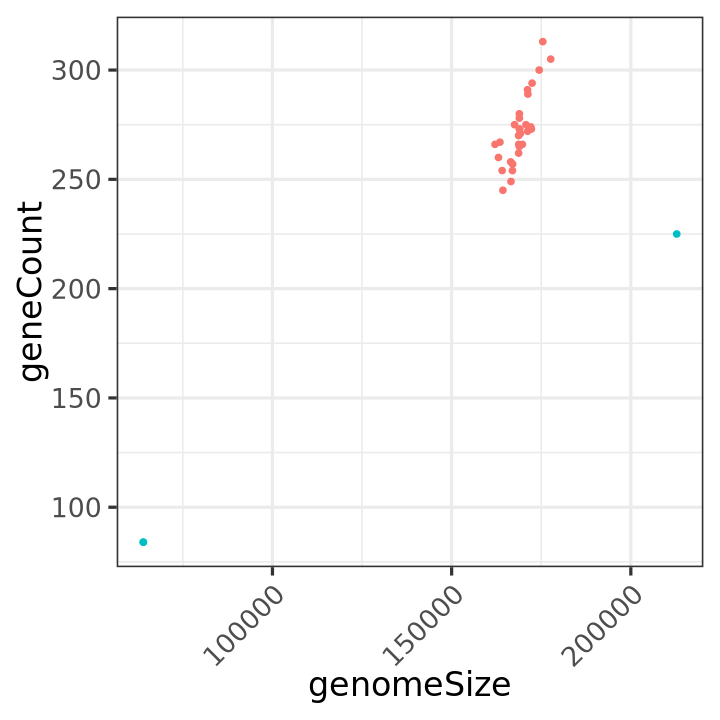

In [107]:
## Compare genomeSize and geneCount
options(repr.plot.width=6, repr.plot.height=6)

# Plot
ggplot(report, aes(x=genomeSize, y=geneCount, col=Genus)) +
    geom_point() +
    theme_bw(20) +
    theme(
        axis.text.x = element_text(angle=45, hjust=1, vjust=1)
    ) +
    guides(
        col = guide_none()
    )

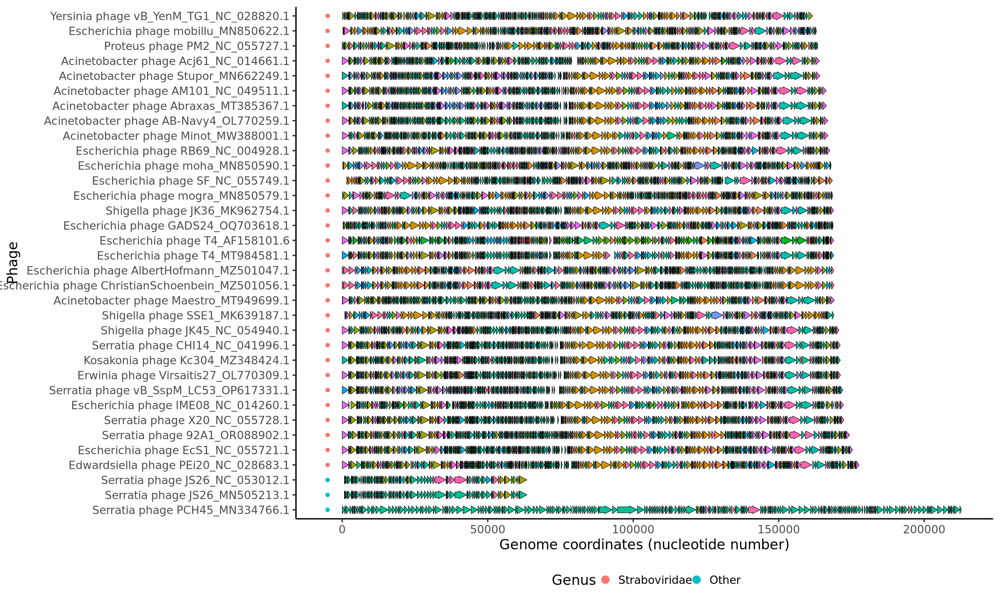

In [132]:
## Select genomes randomly
options(repr.plot.width=20, repr.plot.height=12)

# Fetch data
set.seed(42) # change seed for different result
df <- data
df <- df[order(df$Genus, df$genomeSize, decreasing = c(TRUE, TRUE)), ]
df$phage_id <- factor(df$phage_id, unique(df$phage_id))

# Mutate
df <- df %>% group_by(phage_id) %>% mutate(total=max(gene_stop, na.rm = TRUE), ratio_start=gene_start/total, ratio_stop=gene_stop/total)

# Plot
ggplot(df, aes(xmin = gene_start, xmax = gene_stop, y = phage_id, fill = Gene.CDS.Name)) +
    geom_gene_arrow() +
    geom_point(aes(x=-5000, col=Genus), size=2) +
    theme_classic(20) +
    guides(fill = guide_none(), 
           col = guide_legend(override.aes = list(size=5), position = 'bottom', nrow = 1)) +
    labs(x = "Genome coordinates (nucleotide number)", y = "Phage")

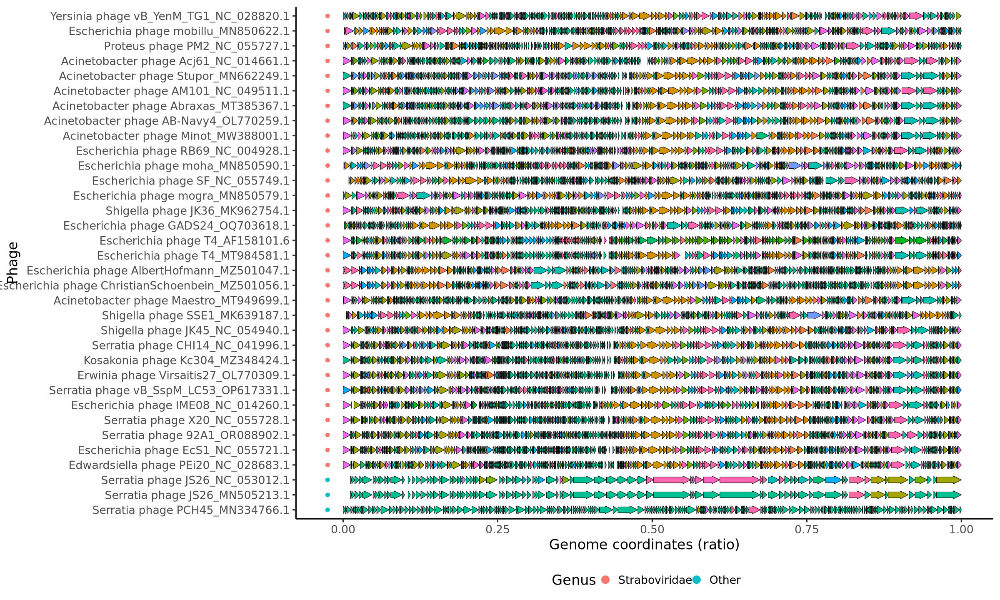

In [133]:
# Plot
ggplot(df, aes(xmin = ratio_start, xmax = ratio_stop, y = phage_id, fill = Gene.CDS.Name)) +
    geom_gene_arrow() +
    geom_point(aes(x=-0.025, col=Genus), size=2) +
    theme_classic(20) +
    guides(fill = guide_none(), 
           col = guide_legend(override.aes = list(size=5), position = 'bottom', nrow = 1)) +
    labs(x = "Genome coordinates (ratio)", y = "Phage")

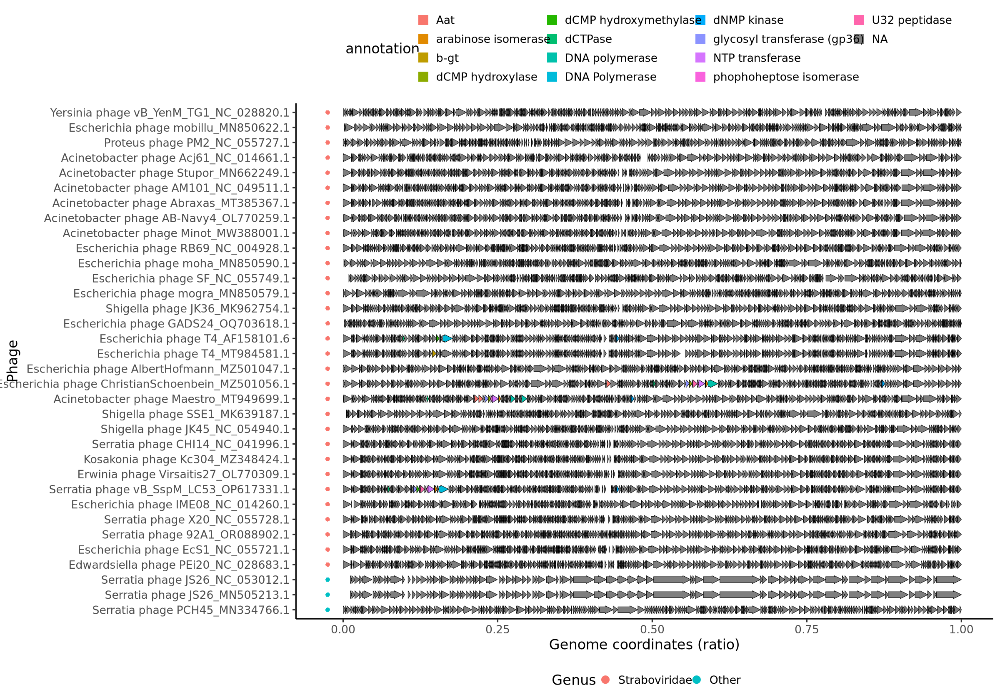

In [135]:
## Select genomes randomly
options(repr.plot.width=20, repr.plot.height=14)

# Plot
ggplot(df, aes(xmin = ratio_start, xmax = ratio_stop, y = phage_id, fill = annotation)) +
    geom_gene_arrow() +
    geom_point(aes(x=-0.025, col=Genus), size=2) +
    #scale_fill_manual(values = cols$annotation) +
    theme_classic(20) +
    guides(fill = guide_legend(override.aes = list(size=0, stroke=0), position = 'top', nrow = 4), 
           col = guide_legend(override.aes = list(size=5), position = 'bottom', nrow = 1)) +
    labs(x = "Genome coordinates (ratio)", y = "Phage")

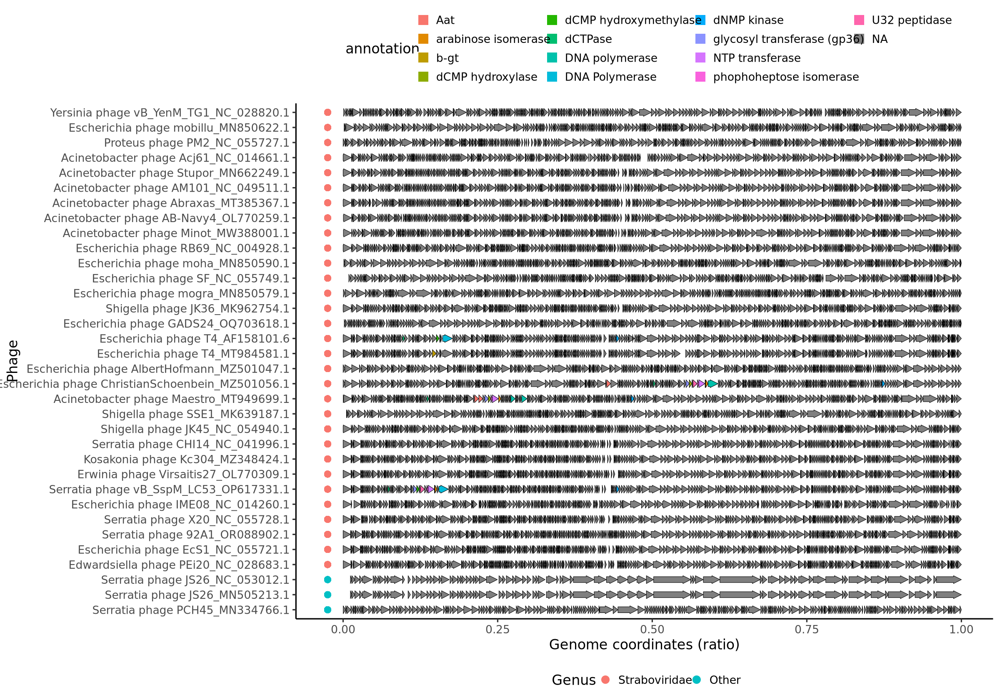

In [136]:
# Plot
# df[!is.na(df$annotation), ]
ggplot(df, aes(xmin = ratio_start, xmax = ratio_stop, y = phage_id, fill = annotation)) +
    geom_gene_arrow() +
    geom_point(aes(x=-0.025, col=Genus), size=4) +
    theme_classic(20) +
    guides(fill = guide_legend(override.aes = list(size=0, stroke=0), position = 'top', nrow = 4), 
           col = guide_legend(override.aes = list(size=5), position = 'bottom', nrow = 1)) +
    labs(x = "Genome coordinates (ratio)", y = "Phage")

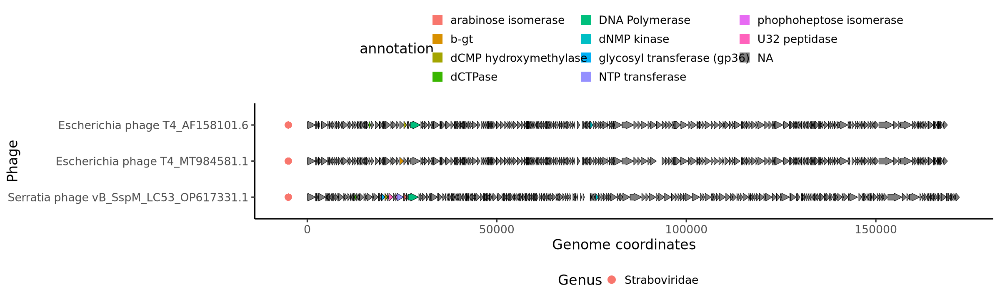

In [158]:
# Comparison of T4 and LC54
options(repr.plot.width=20, repr.plot.height=6)

# Fetch data
df <- data
df <- df[order(df$Genus, df$genomeSize, decreasing = c(TRUE, TRUE)), ]
df$phage_id <- factor(df$phage_id, unique(df$phage_id))

# Mutate
df <- df %>% group_by(phage_id) %>% mutate(total=max(gene_stop, na.rm = TRUE), ratio_start=gene_start/total, ratio_stop=gene_stop/total)

## Subset
df <- df %>% subset(virusName %in% c("Escherichia phage T4","Serratia phage vB_SspM_LC53"))

## Plot
ggplot(df, aes(xmin = gene_start, xmax = gene_stop, y = phage_id, fill = annotation)) +
    geom_gene_arrow() +
    geom_point(aes(x=-5000, col=Genus), size=4) +
    theme_classic(20) +
    guides(fill = guide_legend(override.aes = list(size=0, stroke=0), position = 'top', nrow = 4), 
           col = guide_legend(override.aes = list(size=5), position = 'bottom', nrow = 1)) +
    labs(x = "Genome coordinates", y = "Phage")

Warning message:
“Removed 725 rows containing missing values or values outside the scale range (`geom_gene_arrow()`).”
Warning message:
“Removed 835 rows containing missing values or values outside the scale range (`geom_point()`).”


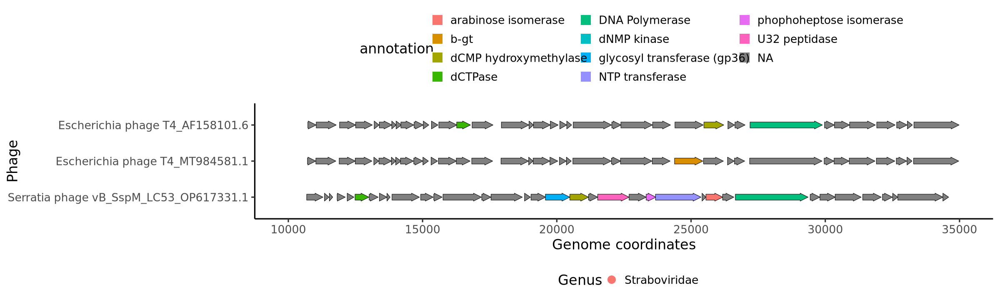

In [163]:
# LC53 arabinosylation cluster
options(repr.plot.width=20, repr.plot.height=6)

# Fetch data
df <- data
df <- df[order(df$Genus, df$genomeSize, decreasing = c(TRUE, TRUE)), ]
df$phage_id <- factor(df$phage_id, unique(df$phage_id))

# Mutate
df <- df %>% group_by(phage_id) %>% mutate(total=max(gene_stop, na.rm = TRUE), ratio_start=gene_start/total, ratio_stop=gene_stop/total)

## Subset
df <- df %>% subset(virusName %in% c("Escherichia phage T4","Serratia phage vB_SspM_LC53"))

## Plot
ggplot(df, aes(xmin = gene_start, xmax = gene_stop, y = phage_id, fill = annotation)) +
    geom_gene_arrow() +
    geom_point(aes(x=-500, col=Genus), size=4) +
    theme_classic(20) +
    guides(fill = guide_legend(override.aes = list(size=0, stroke=0), position = 'top', nrow = 4), 
           col = guide_legend(override.aes = list(size=5), position = 'bottom', nrow = 1)) +
    labs(x = "Genome coordinates", y = "Phage") +
    scale_x_continuous(limits = c(10000, 35000))

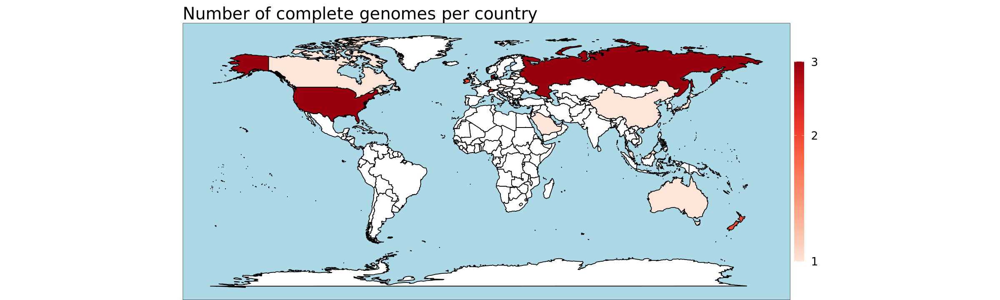

In [13]:
## Show phageCount on world map
options(repr.plot.width=20, repr.plot.height=6)

# Fetch data
world_map = map_data("world")

## Edit geoLocation
report$geoCountry <- str_split(report$geoLocation, ":", simplify=TRUE)[,1]

# Add phageCount
lv <- setNames(as.numeric(table(report$geoCountry)), names(table(report$geoCountry)))
world_map$phageCount <- lv[world_map$region]

# Plot
ggplot(world_map, aes(map_id = region, fill=phageCount)) +
    geom_map(map = world_map, col="black") +
    scale_fill_distiller(palette = "Reds", direction = 1, trans="log10", na.value = "white") +
    expand_limits(x = world_map$long, y = world_map$lat) +
    theme_void(20) +
    theme(
        panel.background = element_rect(fill = "lightblue")
    ) +
    guides(
        fill = guide_colorbar(barheight=20, barwidth=1)
    ) +
    coord_fixed() +
    labs(title="Number of complete genomes per country", fill=NULL)

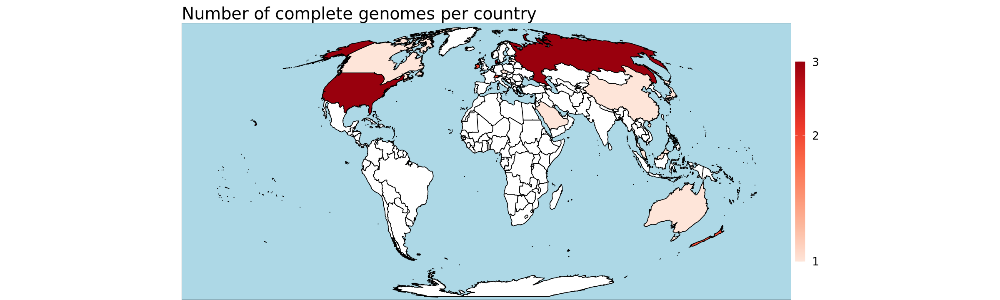

In [14]:
## Preserve area
options(repr.plot.width=20, repr.plot.height=6)

# Fix projection anomalies
world_map <- world_map %>% 
  filter(! long > 180)

# Plot
ggplot(world_map, aes(map_id = region, fill=phageCount)) +
    geom_map(map = world_map, col="black") +
    scale_fill_distiller(palette = "Reds", direction = 1, trans="log10", na.value = "white") +
    expand_limits(x = world_map$long, y = world_map$lat) +
    theme_void(20) +
    theme(
        panel.background = element_rect(fill = "lightblue")
    ) +
    guides(
        fill = guide_colorbar(barheight=20, barwidth=1)
    ) +
    coord_map("moll") +
    labs(title="Number of complete genomes per country", fill=NULL)

In [15]:
## Save modified report
write.csv(report, genomes$overview)

In [16]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Rocky Linux 9.2 (Blue Onyx)

Matrix products: default
BLAS/LAPACK: /home/dieol22p/miniconda3/envs/arabinosylation-anti-crispr/lib/libopenblasp-r0.3.28.so;  LAPACK version 3.12.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: Pacific/Auckland
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] maps_3.4.2.1        spData_2.3.3        sf_1.0-19          
 [4] gggenes_0.5.1       viridis_0.6.5       viridisLite_0.4.2  
 [7] ggplot2_3.5.1       jsonlite_1.8.9      